In [49]:
%load_ext autoreload
%autoreload 2
from DarkMatter import *
from scipy.interpolate import interp1d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [50]:
from hawc_hal import HAL, HealpixConeROI
import matplotlib.pyplot as plt
from threeML import *
from past.utils import old_div
from astromodels import TemplateModelFactory

In [51]:
plt.style.use("default")

## Import HAWC response

In [52]:
# Define the ROI
ra_crab, dec_crab = 83.63,22.02
data_radius = 3.0
model_radius = 8.0

roi = HealpixConeROI(data_radius=data_radius,
                     model_radius=model_radius,
                     ra=ra_crab,
                     dec=dec_crab)


# Instance the plugin
maptree = const.REF_DIR+"/HAWC/HAWC_9bin_507days_crab_data.hd5"
response = const.REF_DIR+"/HAWC/HAWC_9bin_507days_crab_response.hd5"

hawc = HAL("HAWC",
           maptree,
           response,
           roi,
           flat_sky_pixels_size=0.1)

# Use from bin 1 to bin 9
hawc.set_active_measurements(1, 9)

response = hawc._response.get_response_dec_bin(dec = dec_crab)

In [53]:
hawc.display()

[INFO    ] Region of Interest: 
[INFO    ] -------------------
[INFO    ] HealpixConeROI: Center (R.A., Dec) = (83.630, 22.020), data radius = 3.000 deg, model radius: 8.000 deg
[INFO    ] 
[INFO    ] Flat sky projection: 
[INFO    ] --------------------
[INFO    ] Width x height: 160 x 160 px
[INFO    ] Pixel sizes: 0.1 deg
[INFO    ] 
[INFO    ] Response: 
[INFO    ] ---------
[INFO    ] Response file: /Users/dtak/Research/DarkMatter/RefData/HAWC/HAWC_9bin_507days_crab_response.hd5
[INFO    ] Number of dec bins: 101
[INFO    ] Number of energy/nHit planes per dec bin_name: 9
[INFO    ] 
[INFO    ] Map Tree: 
[INFO    ] ----------


,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,450572866.0,4.504941e+08,1.000175,8629,28.290097
1,1,1024,RING,31550239.0,3.150819e+07,1.001335,8629,28.290097
2,2,1024,RING,10080669.0,1.005106e+07,1.002945,8629,28.290097
3,3,1024,RING,2737051.0,2.721557e+06,1.005693,8629,28.290097
4,4,1024,RING,346666.0,3.400225e+05,1.019538,8629,28.290097
5,5,1024,RING,77507.0,7.437867e+04,1.042060,8629,28.290097
6,6,1024,RING,14141.0,1.321418e+04,1.070139,8629,28.290097
7,7,1024,RING,8279.0,7.735450e+03,1.070267,8629,28.290097
8,8,1024,RING,2240.0,2.047489e+03,1.094023,8629,28.290097
9,9,1024,RING,3189.0,2.950479e+03,1.080842,8629,28.290097


[INFO    ] This Map Tree contains 508.195 transits in the first bin
[INFO    ] Total data size: 1.38 Mb
[INFO    ] 
[INFO    ] Active energy/nHit planes (9):
[INFO    ] -------------------------------
[INFO    ] ['1', '2', '3', '4', '5', '6', '7', '8', '9']


### Inital settings

In [68]:
dwarf = "segue_1"
th2Cut = 1
alpha = 1
gJProf = JProfile.calcJProfile(dwarf, seed=defaultNum[dwarf])

newirf = ResponseFunction.newirf("VEGAS")
newirf.exposure = 1
newirf.EA = ResponseFunction.fakeEA(1e-4)
newirf.Bias = ResponseFunction.fakeBias(sigma=0.1)

mass = np.logspace(3, 7.5, 12)
gPSF1D_fake = ResponseFunction.fakePSF(0.1)
jprof =[]
J_fake, temp = JProfile.calcHKConvJProf2D(gJProf, gPSF1D_fake, package="VEGAS", th2Cut=th2Cut)
jprof.append([10, J_fake])
jprof.append([1e9, J_fake])
jprof=np.asarray(jprof)
jProfile_hawc = interp1d(jprof[:,0], jprof[:,1])

sig = Likelihood.calcSignal(dwarf, 1000, newirf, package="VEGAS", DM_spectra="HDM", jProfile=jProfile_hawc, ideal=True)
x, y = getArray(sig)
energies = x*u.GeV
energies = energies.to(u.keV)

chan = ["gamma"]
chan_lab = [r"$e^{+}e^{-}$", r"$\mu^{+}\mu^{-}$", r"$\tau^{+}\tau^{-}$",
            r"$t\bar{t}$", r"$b\bar{b}$",
            r"$W^{+}W^{-}$", r"$Z^{+}Z^{-}$", r"$\gamma\gamma$"]

ls = ["-", "-", "-", "--", "--", ":",":", "-."]

alpha_array = []
for i, res_i in enumerate(response.keys()):
    res = response[res_i]
    r = res._psf.find_eef_radius(0.68)
    gPSF1D_fake = ResponseFunction.fakePSF(r)
    alpha_array.append(r**2/9)

## Generate J profile

In [69]:
for c in tqdm(chan):

    for i, res_i in enumerate(response.keys()):
        jprof = []
        res = response[res_i]
        r = res._psf.find_eef_radius(0.68)
        gPSF1D_fake = ResponseFunction.fakePSF(r)
        J_fake, temp = JProfile.calcHKConvJProf2D(gJProf, gPSF1D_fake, package="VEGAS", th2Cut=0.2**2.)
        jprof.append([10, J_fake])
        jprof.append([1e9, J_fake])
        jprof=np.asarray(jprof)
        jProfile_hawc = interp1d(jprof[:,0], jprof[:,1])

        tmf = TemplateModelFactory(
            f"HDM_{res_i}_{c}_4_test", "A HDM template", energies, ["mass"]
        )

        tmf.define_parameter_grid("mass", mass)

        for m in mass:
            sig = Likelihood.calcSignal(dwarf, m, newirf, package="VEGAS", DM_spectra="HDM", jProfile=jProfile_hawc, 
                                        ideal=True, channel=c, useBias=True)
            x, y = getArray(convertToPDF(sig, norm=False))
            y_u = y/(u.GeV*u.second*u.cm*u.cm)
            y_u[y_u==0]=1e-100/(u.GeV*u.second*u.cm*u.cm)
            y_u = y_u.to(1/(u.keV*u.second*u.cm*u.cm))
            tmf.add_interpolation_data(y_u, mass=m)

        tmf.save_data(overwrite=True)

  0%|          | 0/1 [00:00<?, ?it/s]

## Calculate expected events

In [81]:
from astromodels import TemplateModel

chan = ["gamma", "nue"]
chan_lab = [r"$e^{+}e^{-}$", r"$\mu^{+}\mu^{-}$", r"$\tau^{+}\tau^{-}$", 
            r"$t\bar{t}$", r"$b\bar{b}$",
            r"$W^{+}W^{-}$", r"$Z^{+}Z^{-}$", r"$\gamma^{+}\gamma^{-}$", r"$\nu_e \bar{\nu}_e$"]

cnts = {}

mass = np.logspace(4.5, 7.5, 30)

forElisa = {}
for c in tqdm(chan):
    forElisa[c] = {}
    cnts[c] = []
    for en in mass:
        forElisa[c][en] = {}
        total_counts = np.zeros(len(hawc._active_planes), dtype=float)
        total_model = np.zeros_like(total_counts)
        total_bkg = np.zeros_like(total_counts)

        for i, (res_i, energy_id) in enumerate(zip(response.keys(), hawc._active_planes)):
            
            reloaded_table_model = TemplateModel(f"HDM_{res_i}_{c}_4")
            reloaded_table_model.mass = en

            source = PointSource("hdm", ra=ra_crab, dec=dec_crab, spectral_shape=reloaded_table_model)

            model = Model(source)

            data = DataList(hawc)

            hawc.set_model(model)

            data_analysis_bin = hawc._maptree[energy_id]
        
            this_model_map_hpx = hawc._get_expectation(data_analysis_bin, energy_id, 1, 0)
            forElisa[c][en][i] = this_model_map_hpx
            this_model_tot = np.sum(this_model_map_hpx)
            this_data_tot = np.sum(data_analysis_bin.observation_map.as_partial())
            this_bkg_tot = np.sum(data_analysis_bin.background_map.as_partial())

            total_counts[i] = this_data_tot
            total_model[i] = this_model_tot
            total_bkg[i] = this_bkg_tot
        
        cnts[c].append([en, total_model, total_bkg])
#    cnts[c] = np.asarray(cnts[c])

  0%|          | 0/2 [00:00<?, ?it/s]

In [117]:
print(hawc._maptree[energy_id])

In [139]:
energies

<Quantity [9.456255e+06, 1.061010e+07, 1.190475e+07, 1.335735e+07,
           1.498715e+07, 1.681585e+07, 1.886770e+07, 2.116990e+07,
           2.375305e+07, 2.665135e+07, 2.990330e+07, 3.355205e+07,
           3.764600e+07, 4.223955e+07, 4.739355e+07, 5.317640e+07,
           5.966490e+07, 6.694515e+07, 7.511370e+07, 8.427895e+07,
           9.456255e+07, 1.061010e+08, 1.190475e+08, 1.335735e+08,
           1.498715e+08, 1.681585e+08, 1.886770e+08, 2.116990e+08,
           2.375305e+08, 2.665135e+08, 2.990330e+08, 3.355205e+08,
           3.764600e+08, 4.223955e+08, 4.739355e+08, 5.317640e+08,
           5.966490e+08, 6.694515e+08, 7.511370e+08, 8.427895e+08,
           9.456255e+08, 1.061010e+09, 1.190475e+09, 1.335735e+09,
           1.498715e+09, 1.681585e+09, 1.886770e+09, 2.116990e+09,
           2.375305e+09, 2.665135e+09, 2.990330e+09, 3.355205e+09,
           3.764600e+09, 4.223955e+09, 4.739355e+09, 5.317640e+09,
           5.966490e+09, 6.694515e+09, 7.511370e+09, 8.427895e

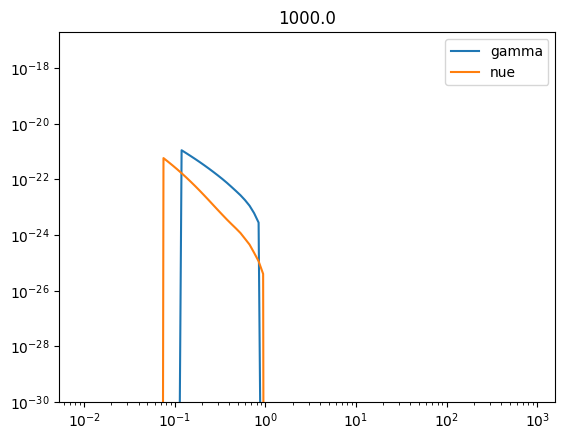

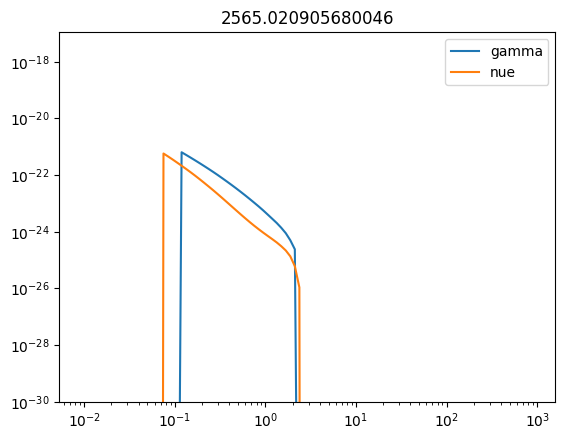

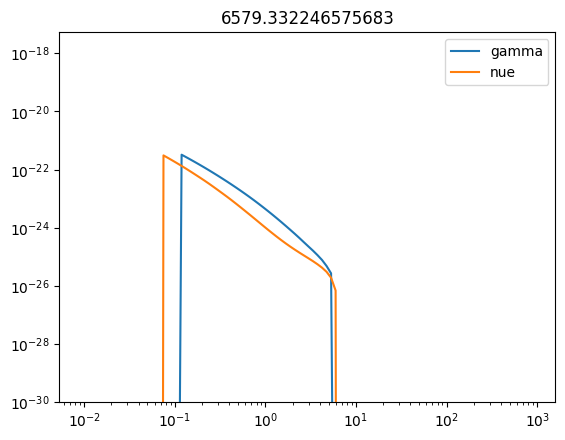

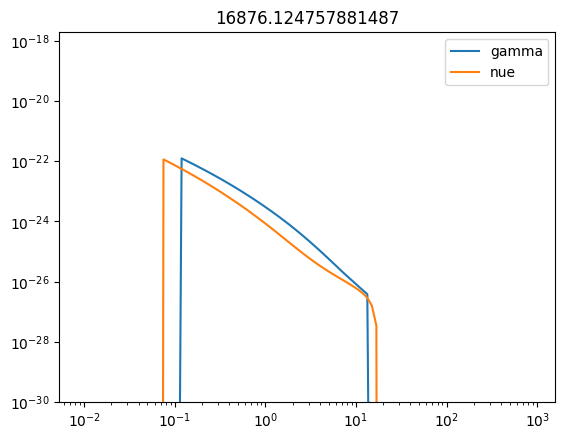

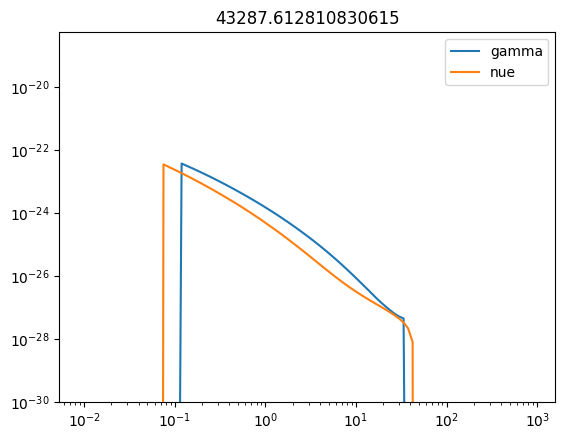

...

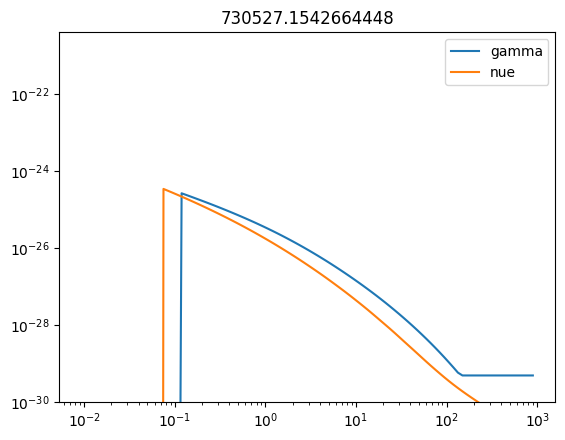

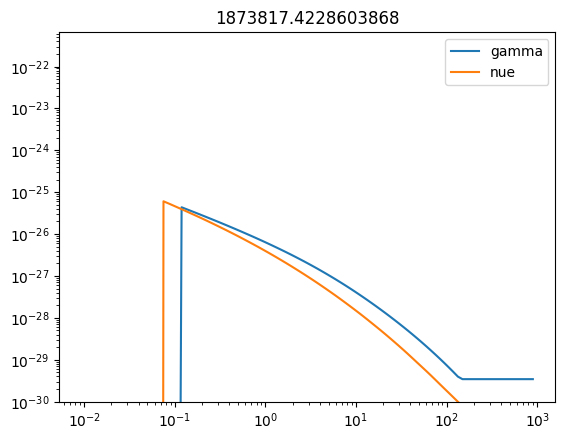

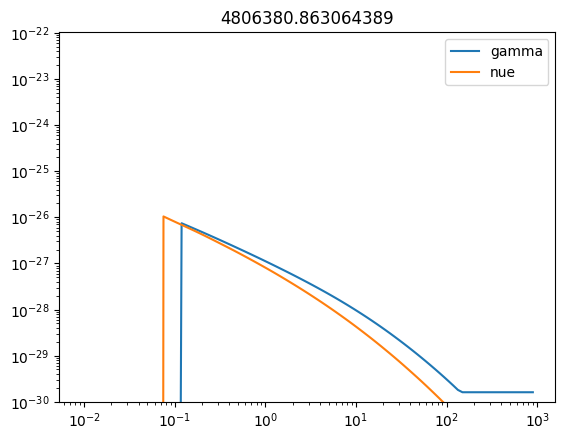

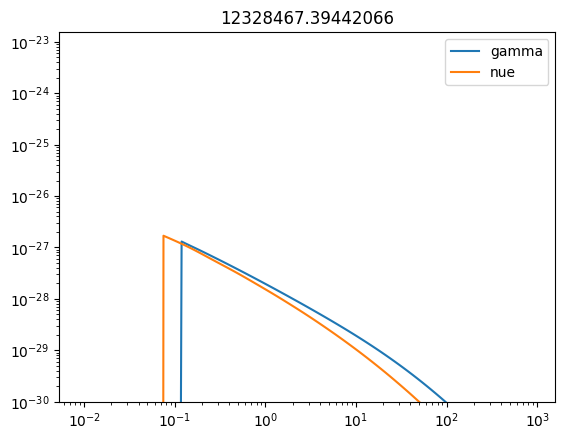

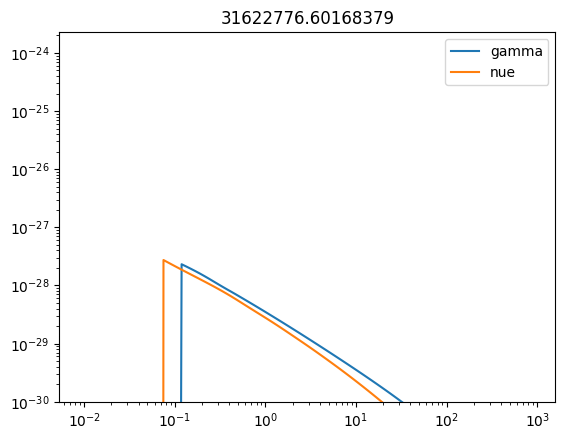

In [141]:
c = "gamma"
for en in mass:
    for c in ["gamma", "nue"]:
        reloaded_table_model = TemplateModel(f"HDM_{res_i}_{c}_4")
        reloaded_table_model.mass = en

        source = PointSource("hdm", ra=ra_crab, dec=dec_crab, spectral_shape=reloaded_table_model)

        model = Model(source)
        plt.plot(energies/1e9, model.get_point_source_fluxes(0, energies), label=c)
    plt.title(en)
    plt.xscale("log")
    plt.yscale("log")
    plt.ylim(1e-30)
    plt.legend()
    plt.show(block=False)

In [122]:
mass = np.logspace(3, 7.5, 12)

In [123]:
model.get_point_source_fluxes(0, mass)

array([1.e-106, 1.e-106, 1.e-106, 1.e-106, 1.e-106, 1.e-106, 1.e-106,
       1.e-106, 1.e-106, 1.e-106, 1.e-106, 1.e-106])

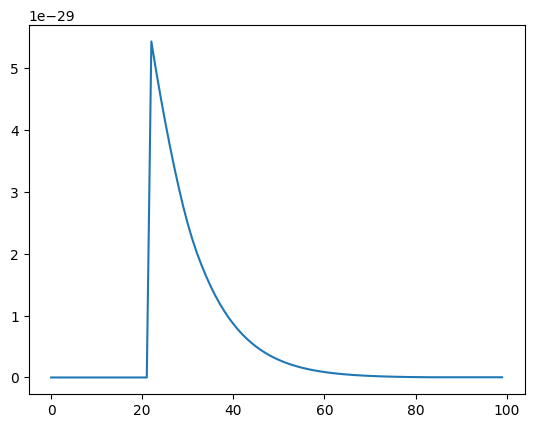

In [95]:
reloaded_table_model.

<function astromodels.functions.function.FunctionMeta.__new__.<locals>.info()>

In [94]:
open('/Users/dtak/.astromodels/data/HDM_9_nue_4.h5')

<_io.TextIOWrapper name='/Users/dtak/.astromodels/data/HDM_9_nue_4.h5' mode='r' encoding='UTF-8'>

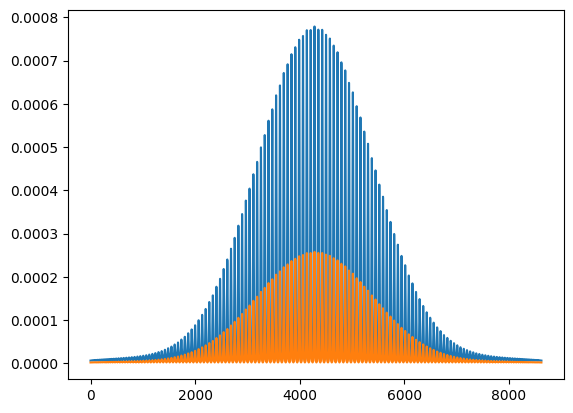

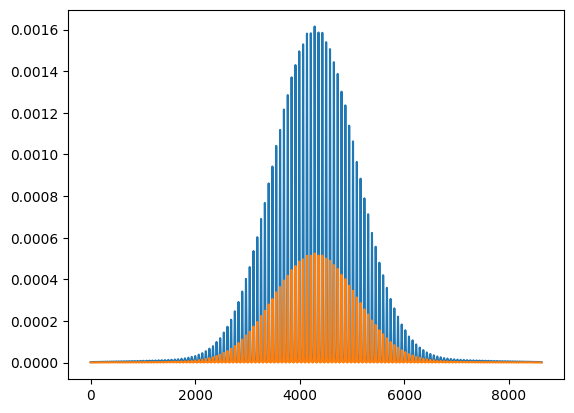

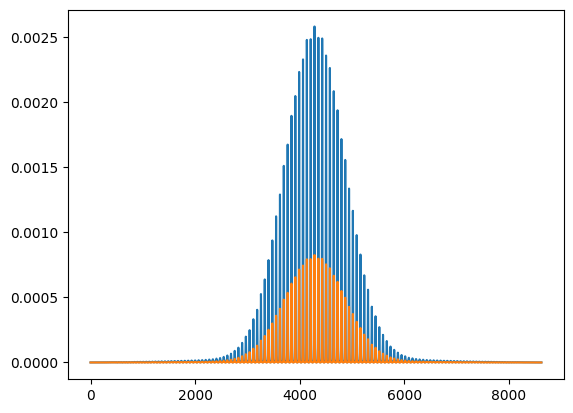

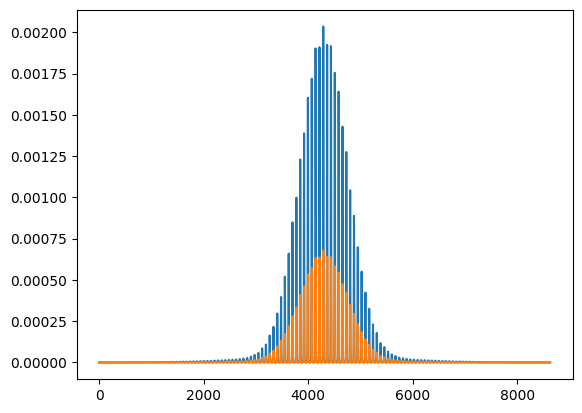

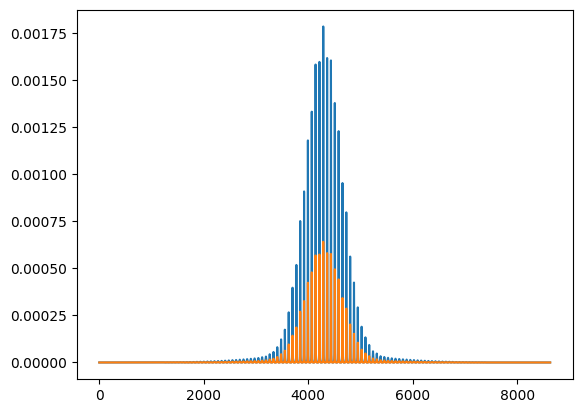

...

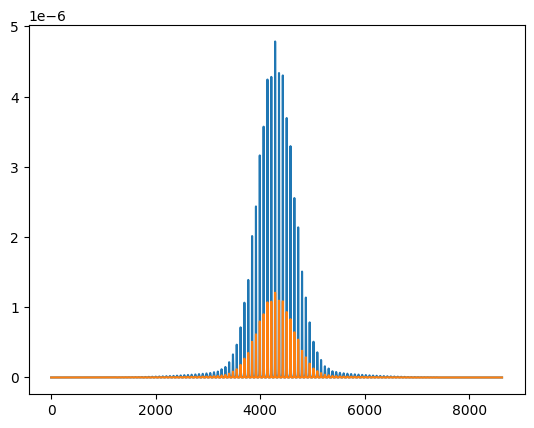

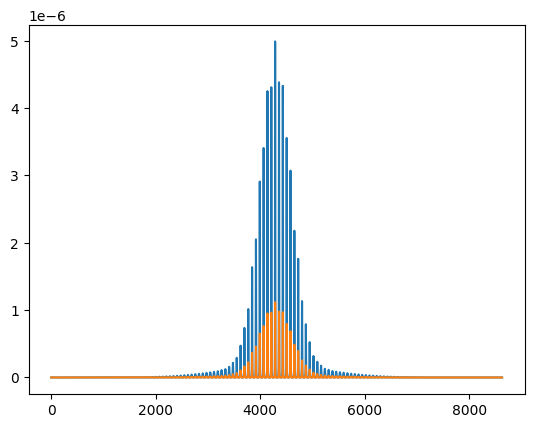

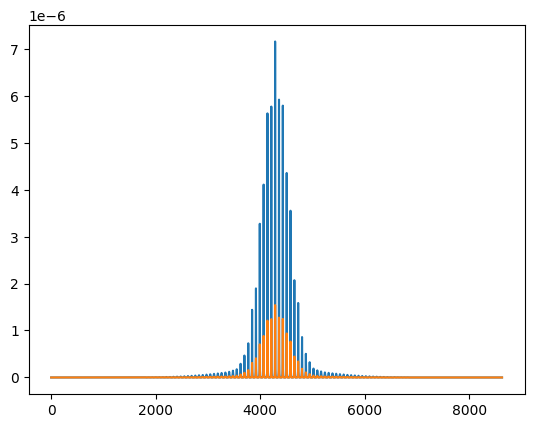

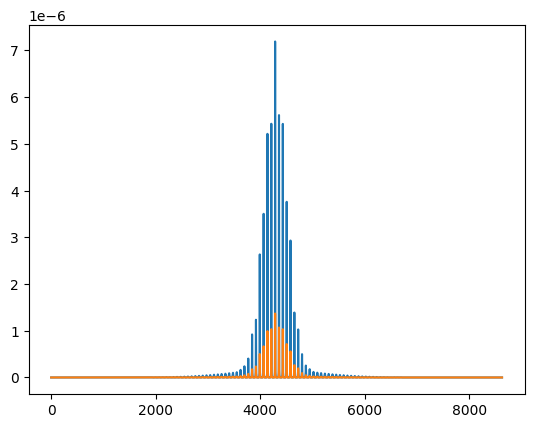

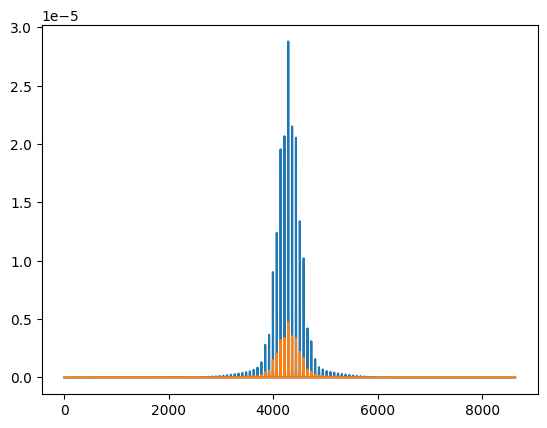

In [84]:
for m in forElisa[c]:
    for b in forElisa[c][m]:
        plt.plot(forElisa["gamma"][m][b])
        plt.plot(forElisa["nue"][m][b])
        plt.show(block=False)

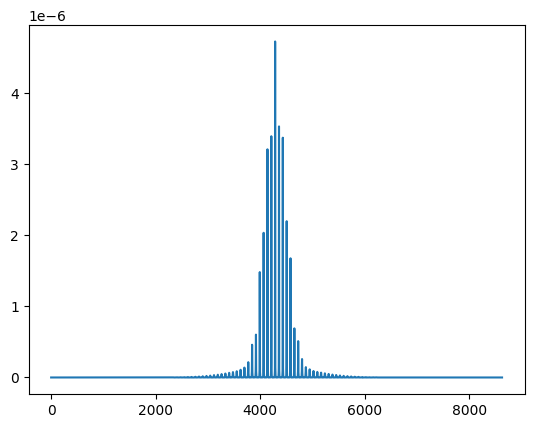

In [80]:
plt.plot(this_model_map_hpx)

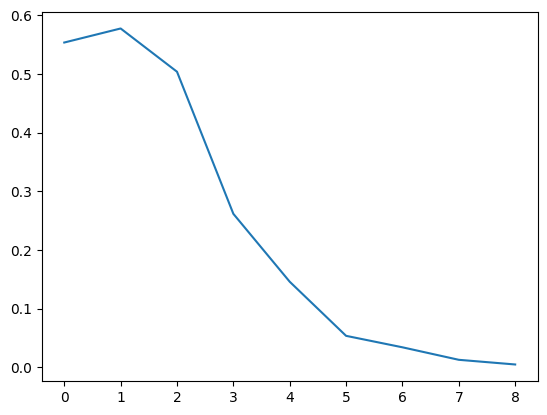

In [71]:
plt.plot(cnts["gamma"][1][1], label="gamma")

Text(0, 0.5, 'counts')

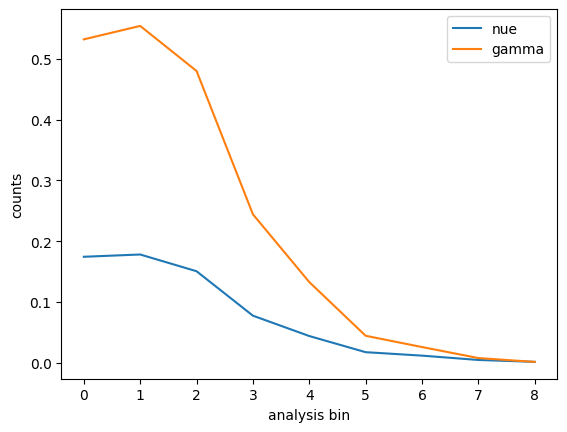

In [67]:
plt.plot(cnts["nue"][1][1], label="nue")
plt.plot(cnts["gamma"][1][1], label="gamma")
plt.legend()
plt.xlabel("analysis bin")
plt.ylabel("counts")

In [62]:
cnts["gamma"][1]

[40128.0703194278,
 array([0.53219783, 0.55430912, 0.48017536, 0.24434317, 0.13280216,
        0.04445118, 0.02588144, 0.00776764, 0.0014084 ]),
 array([3.15081902e+07, 1.00510638e+07, 2.72155716e+06, 3.40022485e+05,
        7.43786653e+04, 1.32141751e+04, 7.73545048e+03, 2.04748895e+03,
        2.95047881e+03])]

In [57]:
chan = ["ee", "uu", "tt", "ttbar", "bbar", "WW", "ZZ", "gamma", "nue"]
chan_lab = [r"$e^{+}e^{-}$", r"$\mu^{+}\mu^{-}$", r"$\tau^{+}\tau^{-}$", 
            r"$t\bar{t}$", r"$b\bar{b}$",
            r"$W^{+}W^{-}$", r"$Z^{+}Z^{-}$", r"$\gamma^{+}\gamma^{-}$", r"$\nu_e \bar{\nu}_e$"]
ls = ["-", "-", "-", "--", "--", ":",":", "-.", "-."]


## Discovery map

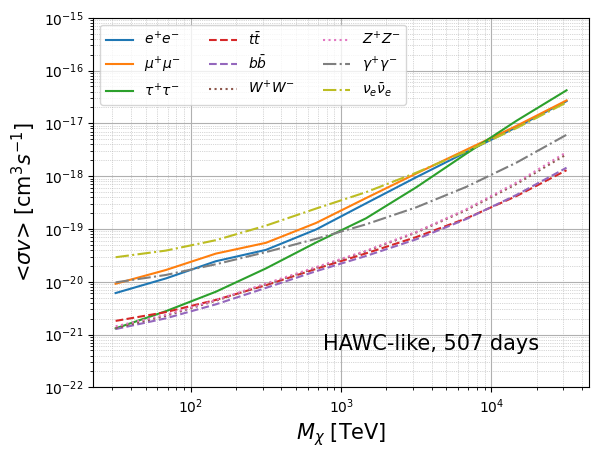

In [58]:
mass = np.logspace(1.50, 4.5, 10)
sigma = np.logspace(-23, -15, 50)
alpha = 0.04/9

for c, cl, l in zip(chan, chan_lab, ls):
    cnts[c] = np.asarray(cnts[c])
    cnt = cnts[c][cnts[c][:,0]!=cnts[c][:,0][4]]
    M = cnt[:,0]
    
    f_mass = interp1d(np.log10(M/1e3), np.log10(cnt[:,1]))
    five_sig = []
    N_bkg = cnt[:,2][0]
    for i, m in enumerate(mass):
        temp = []
        for j, s in enumerate(sigma):
            sig = LiMaSiginficance(N_bkg*alpha+10**f_mass(np.log10(m))*s/1e-23, N_bkg, alpha=alpha)
            temp.append(sig)
        test = interp1d(np.log10(temp), np.log10(sigma))
        
        five_sig.append(test(np.log10(5)))
    five_sig = np.asarray(five_sig)
    plt.plot(mass, 10**five_sig,  label=cl, ls=l)
    data = np.asarray([mass, 10**five_sig]).T
    np.save(f"hawc_like_{c}_disc", data)
plt.xscale("log")
plt.yscale("log")
plt.ylim(1e-22, 1e-16)
plt.grid()

plt.legend(ncol=3)
plt.xlabel(r"$M_{\chi}$ [TeV]", fontsize=15)
plt.ylabel(r"<$\sigma v$> [cm$^{3}s^{-1}$]", fontsize=15)
ax = plt.gca()
plt.text(0.9, 0.1, "HAWC-like, 507 days", fontsize=15, ha="right", transform=ax.transAxes)
ax.grid(b=True, which="major")
ax.grid(b=True, which="minor", ls=":", lw=0.5)
ax.set_ylim(1e-22, 1e-15)    
plt.savefig("HAWC_disc.pdf")

## Calculate upper limits

### - Sanity check

In [8]:
from astromodels import TemplateModel
 
#mass = np.logspace(4.5, 7.5, 5) # for ULs
mass = mass = np.logspace(3, 5, 10) # for check

hSignal = {}
hOff = {}

chan = ["ee", "uu", "tt", "ttbar", "bbar", "WW", "ZZ", "gamma"]

NOff = {}
alpha = 0.2**2./9.
for c in tqdm(chan):
    hSignal[c] = {}
    hOff[c] = {}
    NOff[c] = {}
    for en in mass:
        hSignal[c][en] = np.zeros(len(hawc._active_planes), dtype=float)
        hOff[c][en] = np.zeros_like(hSignal[c][en])
        NOff[c][en] = 0

        for i, (res_i, energy_id) in enumerate(zip(response.keys(), hawc._active_planes)):
            
            reloaded_table_model = TemplateModel(f"HDM_{res_i}_{c}_4")
            reloaded_table_model.mass = en

            source = PointSource("hdm", ra=ra_crab, dec=dec_crab, spectral_shape=reloaded_table_model)

            model = Model(source)

            hawc.set_model(model)

            data_analysis_bin = hawc._maptree[energy_id]

            this_model_map_hpx = hawc._get_expectation(data_analysis_bin, energy_id, 1, 0)
            this_bkg_tot = np.sum(data_analysis_bin.background_map.as_partial())
            
            test = data_analysis_bin.background_map.as_partial()

            this_model_tot = np.sum(this_model_map_hpx)

            hSignal[c][en][i] = this_model_tot
            hOff[c][en][i] = this_bkg_tot*alpha
            NOff[c][en] += this_bkg_tot

        

  0%|          | 0/8 [00:00<?, ?it/s]

In [10]:
filename="sanity_check_hawk_bbar"

ts_all = []
runs = 300

ul = {}
for M in mass:
    ul[M] = []
    
#0.2936328473123178
alpha = 0.2**2./9.
mass = np.logspace(3, 5, 10)
    
pbar = tqdm(total=len(mass)*runs)

c = "bbar"
dwarf="segue_1"

for j in range(runs):
    for i, M in enumerate(mass):
        hOn = np.zeros_like(hOff[c][M])
        for k, (bkg) in enumerate(zip(hOff[c][M])):

            hOn[k] = np.random.poisson(bkg)
        
        h_off = convertHist(range(9), hOff[c][M])
        h_on = convertHist(range(9), hOn)
        h_sig = convertHist(range(9), hSignal[c][M])

        mle = Likelihood.MLE(dwarf, M, "VEGAS", channel=c, irf=newirf, jProfile=jProfile_hawc, 
                th2Cut=th2Cut, addTheta=False, 
                averagedIRF=True, version="all", 
                seed=8, expectedLimit=True, 
                bkgModel=None, ext=False, alpha = alpha,
                verbose=False, statistic="binned", DM_spectra="HDM", 
                hSignal=h_sig, hOff = h_off, hOn=h_on, N_on=sum(hOn), N_off=NOff[c][M]) 
        mle.minuit(method=2, upperLimit=True, fix_b=False)
        ts_all.append(mle.ts)
        if not(np.isnan(mle.signu_ul)):
            ul[M].append(mle.signu_ul)
                
        pbar.update(1)

        
np.save(const.OUTPUT_DIR+filename, ul)

  0%|          | 0/3000 [00:00<?, ?it/s]

[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).
[Error] MIGRAD is NOT converged. Check initial parameters (minuit in mle.py).


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### - Upper limits

In [47]:
from astromodels import TemplateModel
 
mass = np.logspace(4.5, 7.5, 7) # for ULs
#mass = mass = np.logspace(3, 5, 10) # for check

hSignal = {}
hOff = {}

chan = ["nue"]

NOff = {}
alpha = 0.2**2./9.
for c in tqdm(chan):
    hSignal[c] = {}
    hOff[c] = {}
    NOff[c] = {}
    if c == "gamma":
#        ebins = response['9'].sim_energy_bin_centers*1e3
#        mass = ebins[ebins>=10**4.5]
        mass = [10**7.5]
        
    for en in mass:
        
        hSignal[c][en] = np.zeros(len(hawc._active_planes), dtype=float)
        hOff[c][en] = np.zeros_like(hSignal[c][en])
        NOff[c][en] = 0

        for i, (res_i, energy_id) in enumerate(zip(response.keys(), hawc._active_planes)):
            
            reloaded_table_model = TemplateModel(f"HDM_{res_i}_{c}_4")
            reloaded_table_model.mass = en

            source = PointSource("hdm", ra=ra_crab, dec=dec_crab, spectral_shape=reloaded_table_model)

            model = Model(source)

            hawc.set_model(model)

            data_analysis_bin = hawc._maptree[energy_id]

            this_model_map_hpx = hawc._get_expectation(data_analysis_bin, energy_id, 1, 0)
            this_bkg_tot = np.sum(data_analysis_bin.background_map.as_partial())
            
            test = data_analysis_bin.background_map.as_partial()

            this_model_tot = np.sum(this_model_map_hpx)

            hSignal[c][en][i] = this_model_tot
            hOff[c][en][i] = this_bkg_tot*alpha
            NOff[c][en] += this_bkg_tot

        

  0%|          | 0/1 [00:00<?, ?it/s]

In [75]:
gJProf = JProfile.calcJProfile(dwarf)

ts_all = []
runs = 100

#0.2936328473123178
mass = np.logspace(4.5, 7.5, 5)
alpha=0.04/9
pbar = tqdm(total=len(mass)*runs*len(chan))

dwarf="segue_1"
chan = ["nue", "gamma"]
chan_lab = [r"$e^{+}e^{-}$", r"$\mu^{+}\mu^{-}$", r"$\tau^{+}\tau^{-}$",
            r"$t\bar{t}$", r"$b\bar{b}$",
            r"$W^{+}W^{-}$", r"$Z^{+}Z^{-}$", r"$\gamma\gamma$"]
events = Likelihood.VEGAS.readData(dwarf, rawdata=True)
for c in chan:
    filename="hawc_like_{}".format(c)

    ul = {}
    for M in mass:
        ul[M] = []
    for j in range(runs):
        gJProf = JProfile.calcJProfile(dwarf)
        for i, res_i in enumerate(response.keys()):
            jprof = []
            res = response[res_i]
            r = res._psf.find_eef_radius(0.68)
            gPSF1D_fake = ResponseFunction.fakePSF(r)
            J_fake, temp = JProfile.calcHKConvJProf2D(gJProf, gPSF1D_fake, package="VEGAS", th2Cut=0.2**2.)
            jprof.append([10, J_fake])
            jprof.append([1e9, J_fake])
            jprof=np.asarray(jprof)
            jProfile_hawc = interp1d(jprof[:,0], jprof[:,1])

            tmf = TemplateModelFactory(
                f"HDM_{res_i}_{c}", "A HDM template", energies, ["mass"]
            )

            tmf.define_parameter_grid("mass", mass)

            for m in mass:
                sig = Likelihood.calcSignal(dwarf, m, newirf, package="VEGAS", DM_spectra="HDM", jProfile=jProfile_hawc, 
                                            ideal=True, channel=c)
                x, y = getArray(convertToPDF(sig, norm=False))
                y_u = y/(u.GeV*u.second*u.cm*u.cm)
                y_u[y_u==0]=1e-100/(u.GeV*u.second*u.cm*u.cm)
                y_u = y_u.to(1/(u.keV*u.second*u.cm*u.cm))
                tmf.add_interpolation_data(y_u, mass=m)

            tmf.save_data(overwrite=True)
    
        hSignal[c] = {}
        hOff[c] = {}
        NOff[c] = {}
        for en in mass:
            hSignal[c][en] = np.zeros(len(hawc._active_planes), dtype=float)
            hOff[c][en] = np.zeros_like(hSignal[c][en])
            NOff[c][en] = 0

            for i, (res_i, energy_id) in enumerate(zip(response.keys(), hawc._active_planes)):

                reloaded_table_model = TemplateModel(f"HDM_{res_i}_{c}_temp")
                reloaded_table_model.mass = en

                source = PointSource("hdm", ra=ra_crab, dec=dec_crab, spectral_shape=reloaded_table_model)

                model = Model(source)

                hawc.set_model(model)

                data_analysis_bin = hawc._maptree[energy_id]

                this_model_map_hpx = hawc._get_expectation(data_analysis_bin, energy_id, 1, 0)
                this_bkg_tot = np.sum(data_analysis_bin.background_map.as_partial())

                test = data_analysis_bin.background_map.as_partial()

                this_model_tot = np.sum(this_model_map_hpx)

                hSignal[c][en][i] = this_model_tot
                hOff[c][en][i] = this_bkg_tot*alpha
                NOff[c][en] += this_bkg_tot
                
        for i, M in enumerate(mass):
            hOn = np.zeros_like(hOff[c][M])
            for k, bkg in enumerate(hOff[c][M]):

                hOn[k] = bkg

            h_off = convertHist(range(9), hOff[c][M])
            h_on = convertHist(range(9), hOn)
            h_sig = convertHist(range(9), hSignal[c][M])

            mle = Likelihood.MLE(dwarf, M, "VEGAS", channel=c, irf=newirf, jProfile=jProfile_hawc, 
                th2Cut=th2Cut, addTheta=False, 
                averagedIRF=True, version="all", 
                seed=8, expectedLimit=True, 
                bkgModel=None, ext=False, alpha = alpha, events=events,
                verbose=False, statistic="binned", DM_spectra="HDM", 
                hSignal=h_sig, hOff = h_off, hOn=h_on, N_on=sum(hOn), N_off=NOff[c][M]) 
            mle.minuit(method=2, upperLimit=True, fix_b=False)
            ts_all.append(mle.ts)
            if not(np.isnan(mle.signu_ul)):
                ul[M].append(mle.signu_ul)

            pbar.update(1)

    np.save(const.OUTPUT_DIR+filename, ul)

  0%|          | 0/500 [00:00<?, ?it/s]


KeyboardInterrupt



In [21]:
ebins

array([1.05925373e+00, 1.18850223e+00, 1.33352143e+00, 1.49623566e+00,
       1.67880402e+00, 1.88364909e+00, 2.11348904e+00, 2.37137371e+00,
       2.66072506e+00, 2.98538262e+00, 3.34965439e+00, 3.75837404e+00,
       4.21696503e+00, 4.73151259e+00, 5.30884444e+00, 5.95662144e+00,
       6.68343918e+00, 7.49894209e+00, 8.41395142e+00, 9.44060876e+00,
       1.05925373e+01, 1.18850223e+01, 1.33352143e+01, 1.49623566e+01,
       1.67880402e+01, 1.88364909e+01, 2.11348904e+01, 2.37137371e+01,
       2.66072506e+01, 2.98538262e+01, 3.34965439e+01, 3.75837404e+01,
       4.21696503e+01, 4.73151259e+01, 5.30884444e+01, 5.95662144e+01,
       6.68343918e+01, 7.49894209e+01, 8.41395142e+01, 9.44060876e+01,
       1.05925373e+02, 1.18850223e+02, 1.33352143e+02, 1.49623566e+02,
       1.67880402e+02, 1.88364909e+02, 2.11348904e+02, 2.37137371e+02,
       2.66072506e+02, 2.98538262e+02, 3.34965439e+02, 3.75837404e+02,
       4.21696503e+02, 4.73151259e+02, 5.30884444e+02, 5.95662144e+02,
      

In [24]:
ts_all = []
runs = 100

#0.2936328473123178
mass = np.logspace(4.5, 7.5, 7)
    
pbar = tqdm(total=len(mass)*runs*len(chan))

dwarf="segue_1"
chan = ["gamma"]
chan_lab = [r"$e^{+}e^{-}$", r"$\mu^{+}\mu^{-}$", r"$\tau^{+}\tau^{-}$",
            r"$t\bar{t}$", r"$b\bar{b}$",
            r"$W^{+}W^{-}$", r"$Z^{+}Z^{-}$", r"$\gamma\gamma$"]
events = Likelihood.VEGAS.readData(dwarf, rawdata=True)
for c in chan:
    filename="hawc_like_{}_new_add".format(c)
    
    if c == "gamma":
#        ebins = response['9'].sim_energy_bin_centers*1e3
#        mass = ebins[ebins>=10**4.5]
        mass = [10**7.5]
    
    ul = {}
    for M in mass:
        ul[M] = []
        
   
    
    for j in range(runs):
        for i, M in enumerate(mass):
            hOn = np.zeros_like(hOff[c][M])
            for k, bkg in enumerate(hOff[c][M]):

                hOn[k] = np.random.poisson(bkg)

            h_off = convertHist(range(9), hOff[c][M])
            h_on = convertHist(range(9), hOn)
            h_sig = convertHist(range(9), hSignal[c][M])

            mle = Likelihood.MLE(dwarf, M, "VEGAS", channel=c, irf=newirf, jProfile=jProfile_hawc, 
                th2Cut=th2Cut, addTheta=False, 
                averagedIRF=True, version="all", 
                seed=8, expectedLimit=True, 
                bkgModel=None, ext=False, alpha = alpha, events=events,
                verbose=False, statistic="binned", DM_spectra="HDM", 
                hSignal=h_sig, hOff = h_off, hOn=h_on, N_on=sum(hOn), N_off=NOff[c][M]) 
            mle.minuit(method=2, upperLimit=True, fix_b=False)
            ts_all.append(mle.ts)
            if not(np.isnan(mle.signu_ul)):
                ul[M].append(mle.signu_ul)

            pbar.update(1)

    np.save(const.OUTPUT_DIR+filename, ul)

  0%|          | 0/700 [00:00<?, ?it/s]

  FUNCTION VALUE DOES NOT SEEM TO DEPEND ON ANY OF THE 2 VARIABLE PARAMETERS.
          VERIFY THAT STEP SIZES ARE BIG ENOUGH AND CHECK FCN LOGIC.
 *******************************************************************************
 *******************************************************************************
  FUNCTION VALUE DOES NOT SEEM TO DEPEND ON ANY OF THE 2 VARIABLE PARAMETERS.
          VERIFY THAT STEP SIZES ARE BIG ENOUGH AND CHECK FCN LOGIC.
 *******************************************************************************
 *******************************************************************************


In [ ]:
settign 1
sig 1 deg, back 3 deg -> alpha (1/3)^2
setting 2
sig 0.2 deg back 3deg -> alpha (0.2/3)^2 -0.04/9
setting 3
sig eng dep back 3deg -> alpha (0.2/3)^2
setting 4
sig eng dep back 3deg -> alpha (0.2936328473123178/3)^2

In [105]:
for c, cl, l in zip(chan, chan_lab, ls):
    filename = "hawc_like_"+c
    a = np.load(const.OUTPUT_DIR+filename+".npy", allow_pickle=True).item()
    a.pop(316227.7660168379)
    np.save(const.OUTPUT_DIR+filename+"_v2.npy", a)

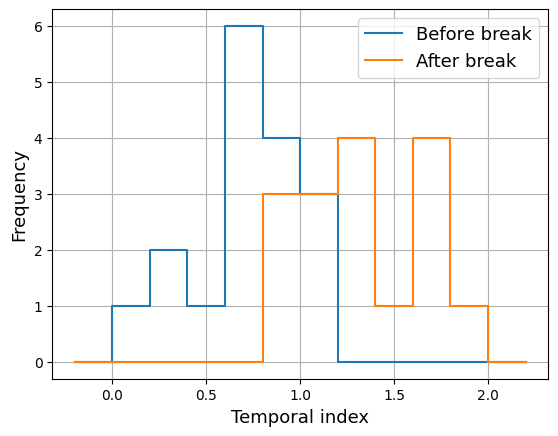

In [25]:
a = [0, 1, 2, 1, 6, 4, 3, 0, 0, 0, 0, 0, 0]
b = [0, 0, 0, 0, 0, 3, 3, 4, 1, 4, 1, 0, 0]
c = [-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2]
plt.step(c, a, where="post", label="Before break")
plt.step(c, b, where="post", label="After break")
#plt.step(c, np.asarray(a)+np.asarray(b), where="post", label="Sum")
plt.ylabel("Frequency", fontsize=13)
plt.xlabel("Temporal index", fontsize=13)
plt.grid()
plt.legend(fontsize=13)

In [27]:
0.35**2

0.12249999999999998

In [28]:
0.5**2.

0.25

In [ ]:
filename = "hawc_like_"+c

In [1]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

In [ ]:
const.OUTPUT_DIR

In [33]:
g = np.load(const.OUTPUT_DIR+"hawc_like_gamma_new.npy", allow_pickle=True).item()

In [35]:
gd

{31622776.60168379: [-18.922230942884745,
  -19.236261428306864,
  -18.96485505288897,
  -18.982006211907063,
  -19.1962339196299,
  -19.168143377912333,
  -19.419180375775873,
  -19.036378143030827,
  -19.02190567953692,
  -19.060079340511038,
  -18.867638987428315,
  -19.521304515511936,
  -18.934640808770062,
  -19.221586092717907,
  -18.93459723305329,
  -19.34101304291008,
  -19.245069078420364,
  -18.878952403998582,
  -18.748251143755077,
  -18.943881528924567,
  -19.473204898229135,
  -19.370791776007128,
  -19.014951660216816,
  -19.112987968380768,
  -19.20348082206648,
  -19.17915332166396,
  -19.134790572856566,
  -19.217832479279693,
  -18.841101331959717,
  -19.2569550597572,
  -19.01237065179895,
  -19.28182222131439,
  -18.8275813425015,
  -18.980401947580383,
  -19.52106872046803,
  -19.272680945802925,
  -19.015705946292368,
  -19.314461262350783,
  -18.870190211545435,
  -19.201354030162186,
  -19.01306423207025,
  -18.83286876328665,
  -19.036436422223797,
  -19.263

In [32]:
gd = np.load(const.OUTPUT_DIR+"hawc_like_gamma_new_Add.npy", allow_pickle=True).item()

In [36]:
g[31622776.60168379] = gd[31622776.60168379]

In [38]:
np.save(const.OUTPUT_DIR+"hawc_like_gamma_new", g)

In [ ]:
"hawc_like_gamma_add"

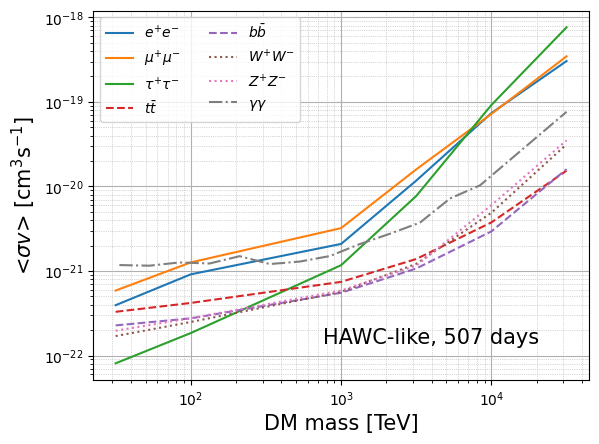

In [47]:
chan = ["ee", "uu", "tt", "ttbar", "bbar", "WW", "ZZ", "gamma"]
chan_lab = [r"$e^{+}e^{-}$", r"$\mu^{+}\mu^{-}$", r"$\tau^{+}\tau^{-}$",
            r"$t\bar{t}$", r"$b\bar{b}$",
            r"$W^{+}W^{-}$", r"$Z^{+}Z^{-}$", r"$\gamma\gamma$"]

ls = ["-", "-", "-", "--", "--", ":",":", "-."]

for c, cl, l in zip(chan, chan_lab, ls):
    if c == "gamma":
        filename = "hawc_like_"+c+"_new_v2"
    else:
        filename = "hawc_like_"+c+"_v2"
    Likelihood.plotExpULcurve(filename=filename, label=cl, units="TeV", ls=l, mean_only=True)
plt.legend(loc=2, ncol=2)

ax = plt.gca()
plt.text(0.9, 0.1, "HAWC-like, 507 days", fontsize=15, ha="right", transform=ax.transAxes)
#plt.text(0.9, 0.2, "95% upper limits", fontsize=15, ha="right", transform=ax.transAxes)
plt.xlabel("DM mass [TeV]", fontsize=15)
#plt.ylim(1e-26, 1e-17)
plt.savefig("HAWC_ULs.pdf")

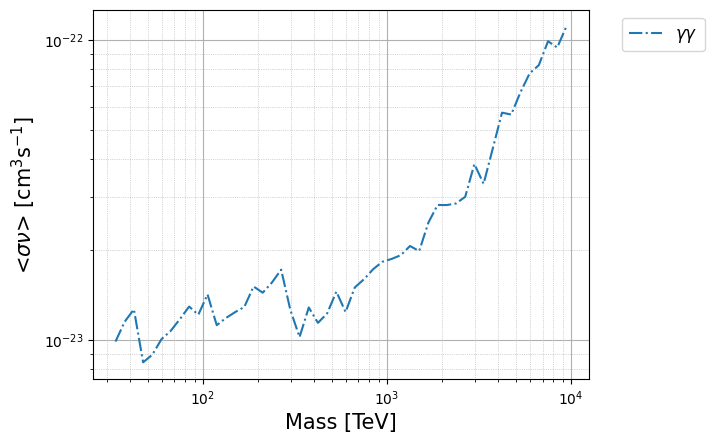

In [158]:
Likelihood.plotExpULcurve(filename="hawc_like_gamma_add", label=cl, units="TeV", ls=l, mean_only=True)

In [72]:
x = [[178.33292, 9.884187E-22],
[192.52306, 5.716984E-22],
[248.49646, 1.4802E-22],
[329.03445, 6.7821275E-23],
[494.97275, 3.411015E-23],
[831.66943, 2.1656177E-23],
[1574.1436, 1.6760358E-23],
[2979.4626, 1.6374395E-23],
[6192.584, 1.9960372E-23],
[11232.919, 2.5492245E-23],
[21997.055, 3.8324267E-23],
[41990.66, 6.107096E-23],
[99152.9, 1.2142749E-22]]


In [78]:
x = np.asarray(x)
x[:,1] = np.log10(x[:,1])

In [79]:
np.save(const.REF_DIR+"all_VERITAS_ttbar", x)

In [44]:
x = np.load(const.OUTPUT_DIR+"hawc_like_gamma_new_v2.npy", allow_pickle=True).item()

In [45]:
i=1
y = {}
for m in x.keys():
    if i == 1:
        y[m] = x[m]
        i=0
    else:
        i=1
y[m] = x[m]

In [46]:
np.save(const.OUTPUT_DIR+"hawc_like_gamma_new_v2",y)

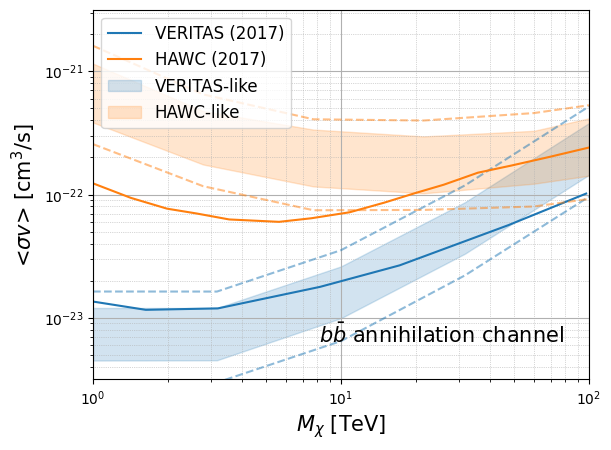

In [73]:
Likelihood.plotULcurve("veritas_216h_bbar", label="VERITAS (2017)", units="TeV")
Likelihood.plotExpULcurve(filename="sanity_check_vts_bbar", label="VERITAS-like", c=const.colors[0], units="TeV", export=True)
Likelihood.plotULcurve("HAWC_bb", ls="-", units="TeV")
Likelihood.plotExpULcurve(filename="sanity_check_hawk_bbar_second", label="HAWC-like", c=colors[1], units="TeV", export=True)
plt.xlim(1, 1e2)
plt.legend(fontsize=12)
plt.title("")
ax = plt.gca()
plt.text(0.95, 0.1, r"$b\bar{b}$ annihilation channel", fontsize=15, ha="right", transform=ax.transAxes)

plt.savefig("sanity_check_bb.pdf")

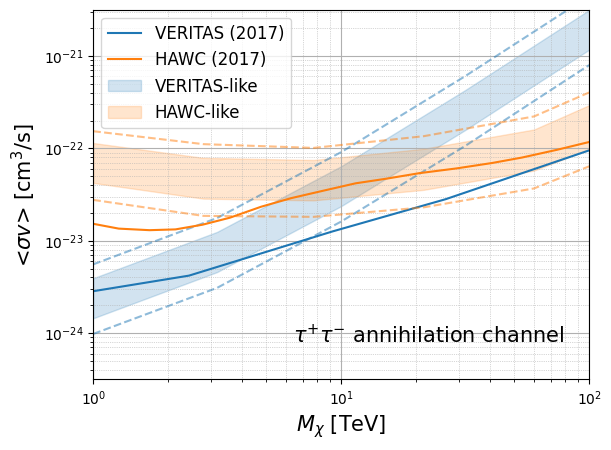

In [74]:
Likelihood.plotULcurve("veritas_216h_tt", label="VERITAS (2017)", units="TeV")
Likelihood.plotExpULcurve(filename="sanity_check_vts", label="VERITAS-like", c=const.colors[0], units="TeV", export=True)
Likelihood.plotULcurve("HAWC", ls="-", units="TeV", label="HAWC (2017)")
Likelihood.plotExpULcurve(filename="sanity_check_hawk_second", label="HAWC-like", c=const.colors[1], units="TeV", export=True)
plt.xlim(1, 1e2)
plt.legend(fontsize=12)
plt.title("")
ax = plt.gca()
plt.text(0.95, 0.1, r"$\tau^{+}\tau^{-}$ annihilation channel", fontsize=15, ha="right", transform=ax.transAxes)

plt.savefig("sanity_check.pdf")
